# Рынок общественного питания в Москве

### Загружаю данные и изучаю общую информацию

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import seaborn as sns
import plotly.express as px 
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [2]:
df=pd.read_csv('/datasets/moscow_places.csv')
display(df.head())
df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
df['name'].nunique(), df['hours'].nunique(), df['price'].nunique(), df['avg_bill'].nunique(), df['middle_avg_bill'].nunique(), df['middle_coffee_cup'].nunique(), df['seats'].nunique()

(5614, 1307, 4, 897, 230, 96, 229)

In [4]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [5]:
df['chain'].sum()
#кол-во сетевых заведений

3205

<div class="alert alert-block alert-info">
<b>Вывод:</b>    
<br>- Общее кол-во записей о заведениях 8406 в датасете
<br>- Представлена 5614 уникальных наименований заведений
<br>- Несоответсвие общего числа заведений и числа уникальных названий обучловлено наличием сетевых заведений с несколькими филлиалами под одним названием
<br>- Типы данных столбцов нормальные

### Предобработка данных

In [6]:
#проверяю на наличие дубликатов
df.duplicated().sum()
#дубликатов нет

0

In [7]:
#Выделяю название улиц из адреса в новый столбец
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек', 'парк','мост', 'километр', 'парк', 'жилой комплекс']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
df['street'] = df['address'].str.extract(str_pat)


display(df['street'].head(15)), df['street'].isna().sum()
#138 пропусков

0               улица Дыбенко
1               улица Дыбенко
2          Клязьминская улица
3     улица Маршала Федоренко
4         Правобережная улица
5              Ижорская улица
6          Клязьминская улица
7          Клязьминская улица
8           Дмитровское шоссе
9             Ангарская улица
10         Левобережная улица
11    улица Маршала Федоренко
12              80-й километр
13            Базовская улица
14            Ангарская улица
Name: street, dtype: object

(None, 138)

In [8]:
#изучаю оставшиеся пропуски
df1=df[df['street'].isnull()]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
print(df1['address'].head())

25                       Москва, парк Левобережный
60       Москва, ландшафтный заказник Лианозовский
64     Москва, Лианозовский парк культуры и отдыха
73                          Москва, парк Алтуфьево
137                   Москва, парк Ангарские пруды
Name: address, dtype: object


<div class="alert alert-block alert-info">
<b>Итог обработки датасета:</b>    
<br>- Сократил кол-во пропусков до 139
<br>- Оставшиеся пропуски обусловлены нестндартным адресом
<br>- Оставшиеся пропуски это 1,6% от общего числа заведений, погрешность небольшая. Оставляю как есть

In [9]:
df['is_24/7'] = df['hours'].str.contains('ежедневно', 'круглосуточно')
df['is_24/7'].isna().sum()
#536 пропусков

536

In [10]:
df.isna().sum()
#пока, оставляю пропуски как есть

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
street                138
is_24/7               536
dtype: int64

<div class="alert alert-block alert-info">
<b>Итог обработки датасета:</b>    
<br>- пропуски есть в 8ми столбцах
<br>- самое большое кол-во пропусков в столбце "middle_coffee_cup"
<br>- оставляю пропуски как есть
<br>- заполнить пропуски самостоятельно, без потери репрезентативности не представляется возможным

### Анализ данных

#### Анализ количества категорий заведений

In [11]:
df['category'].unique(), df['category'].nunique()
#изучаю наименования и количество уникальных категорий

(array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
        'быстрое питание', 'булочная', 'столовая'], dtype=object),
 8)

In [12]:
category_count=df.pivot_table(index='category',values='name',  aggfunc='count').sort_values('name', ascending=False).reset_index()
category_count.columns=['category', 'count']
category_count
#изучаю сводную таблицу по кол-ву категорий заведений

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [13]:
fig = px.bar(category_count, x='category', y='count')
fig.update_layout(title='Анализ кол-ва объектов общественного питания по категориям',
                  xaxis_title="Категории заведений",
                  yaxis_title="Кол-во объектов")
fig.show() 

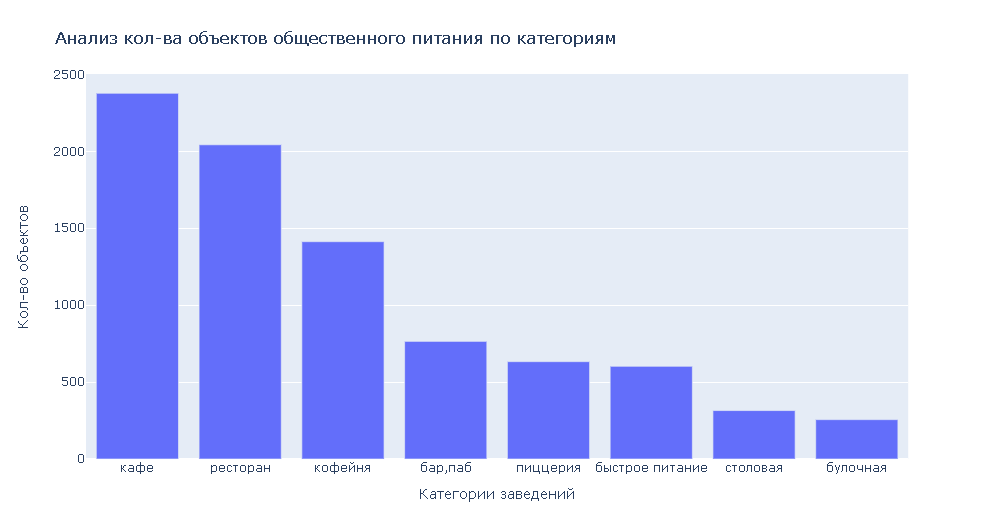

In [14]:
#Для наглядности соотношения категорий строю круговой график
fig = go.Figure(data=[go.Pie(labels=category_count['category'], values=category_count['count'])])
fig.update_layout(title='Анализ кол-ва объектов общественного питания по категориям')
fig.show()

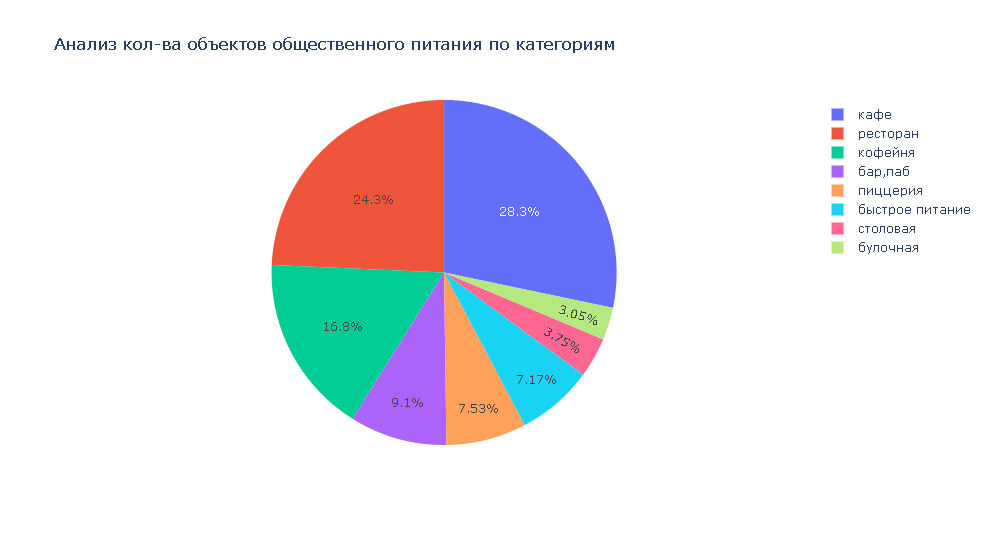

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Самое большое кол-во заведений приходится на три категории: кафе, ресторан и кофейня

#### Анализ количества посадочныех мест по категориям заведений

In [15]:
seats_count=df.pivot_table(index='category', values='seats', aggfunc='median').sort_values('seats', ascending=False).reset_index()
seats_count
#изучаю сводную таблицу кол-ва посадочных мест по категорий заведений

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [16]:
fig = px.bar(seats_count, x='category', y='seats')
fig.update_layout(title='Анализ среднего количества посадочныех мест по категориям заведений',
                  xaxis_title="Категории заведений",
                  yaxis_title="Кол-во посадочных мест")
fig.show() 

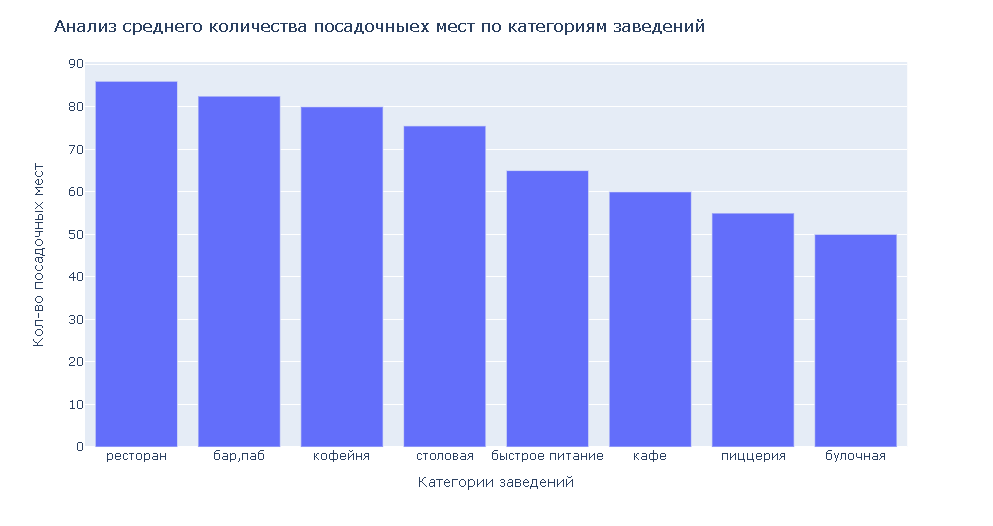

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Самое большое среднее кол-во посадочных мест приходится на три категории: ресторан, бар и кофейня

#### Анализ соотношения сетевых и несетевых заведений

In [17]:
chain=df['chain'].sum()
no_chain=df['chain'].count()-df['chain'].sum()
print(f'Количество сетевых заведений: {chain}')
print(f'Количество сетевых заведений: {no_chain}')

Количество сетевых заведений: 3205
Количество сетевых заведений: 5201


In [18]:
labels_chain=['Сетевые заведения', 'Несетевые заведения']
values_chain=[chain, no_chain]

fig = go.Figure(data=[go.Pie(labels=labels_chain, values=values_chain)])
fig.update_layout(title='Анализ соотношения сетевых и несетевых заведений')
fig.show()

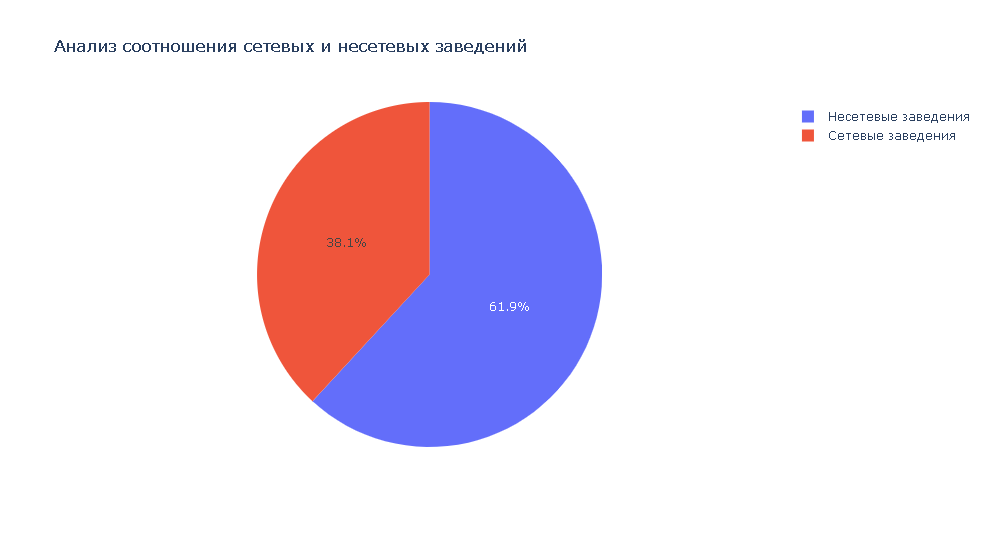

<div class="alert alert-block alert-info">   
    <b>Вывод:</b>
<br>- Сетевых заведений в датасете значительно меньше
<br>- В целом это нормально, расчеты соответствуют логике

#### Анализ сетевых и несетевых категорий заведений

In [19]:
display(df.pivot_table(index=['category', 'chain'], values='name', aggfunc='count').reset_index())
print('булочные, кофейни и пицерии чаще бывают сетевыми')

,category,chain,name
0,"бар,паб",0,596
1,"бар,паб",1,169
2,булочная,0,99
3,булочная,1,157
4,быстрое питание,0,371
5,быстрое питание,1,232
6,кафе,0,1599
7,кафе,1,779
8,кофейня,0,693
9,кофейня,1,720


булочные, кофейни и пицерии чаще бывают сетевыми


In [20]:
#выделяю сетевые заведения в отдельный датасет
df_chain=df.query('chain == 1')

#выделяю НЕсетевые заведения в отдельный датасет
df_no_chain=df.query('chain == 0')

df_chain1=df_chain.pivot_table(index='category', values='name', aggfunc='count').reset_index()
df_no_chain1=df_no_chain.pivot_table(index='category', values='name', aggfunc='count').reset_index()

df_merged = df_chain1.merge(df_no_chain1, how='right', on='category')
df_merged.columns=['category', 'chain', 'no_chain']
print(df_merged)

          category  chain  no_chain
0          бар,паб    169       596
1         булочная    157        99
2  быстрое питание    232       371
3             кафе    779      1599
4          кофейня    720       693
5         пиццерия    330       303
6         ресторан    730      1313
7         столовая     88       227


In [21]:
df_chain2=df_chain.pivot_table(index='category', values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
df_all_cat=df.pivot_table(index='category', values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
df_merged1=df_chain2.merge(df_all_cat, how='right', on='category')

df_merged1.columns=['category', 'chain', 'total']
df_merged1['%']=round(df_merged1['chain']/df_merged1['total']*100, 2)
df_merged1

,category,chain,total,%
0,кафе,779,2378,32.76
1,ресторан,730,2043,35.73
2,кофейня,720,1413,50.96
3,"бар,паб",169,765,22.09
4,пиццерия,330,633,52.13
5,быстрое питание,232,603,38.47
6,столовая,88,315,27.94
7,булочная,157,256,61.33


In [22]:
df_merged1=df_merged1.sort_values('%', ascending=False)

fig = px.bar(df_merged1, x='category', y='%')
fig.update_layout(title='Анализ сетевых категорий заведений',
                  xaxis_title="Категории заведений",
                  yaxis_title="Процент сетевых заведений от общего числа")
fig.show() 

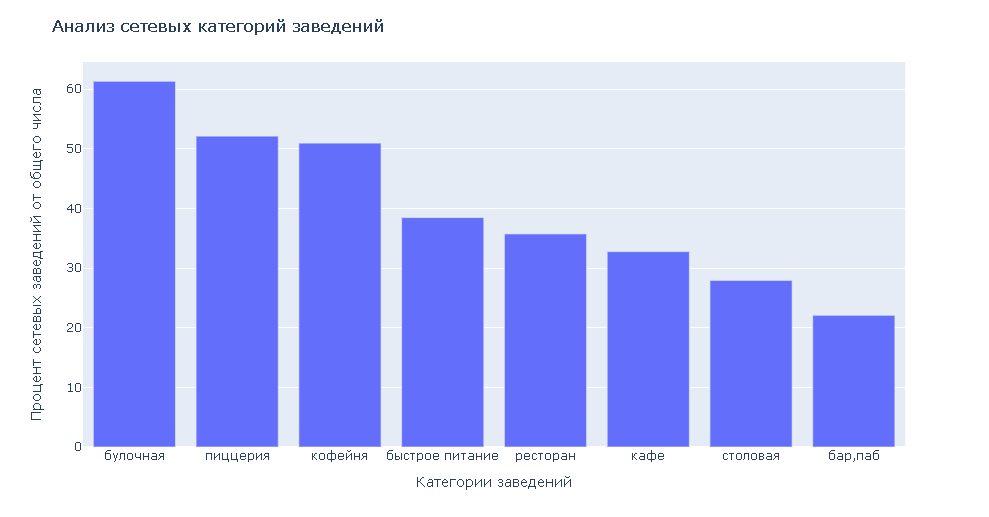

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- У сетевых заведений чаще встречаются категории: <b>кофейни</b>, <b>пицерии</b>, <b>булочная</b>
<br>- У несетевых заведений чаще встречаются категории: <b>кафе</b>, <b>ресторан</b>, <b>паб-бар</b>, <b>столовая</b>
<br>- Категория <b>"быстрое питание"</b> встречается одинаково часто в обеих группах
<br>- Почти 51% кофеен является сетевыми
<br>- Наибольший процент сетевых заведений в категории булочных (61,3%)
<br>- Наименьший процент сетевых заведений в категории бар, паб (22%)

#### Анализ топ-15 сетевых заведений

In [23]:
top15=df_chain.pivot_table(index='name', values='category', aggfunc='count').sort_values('category', ascending=False).reset_index().head(15)
top15

,name,category
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [24]:
fig = px.bar(top15, x='name', y='category')
fig.update_layout(title="Топ-15 популярных сетей",
                  xaxis_title="Наименование заведения",
                  yaxis_title="Кол-во заведений")
fig.update_xaxes(tickangle=45)
fig.show() 

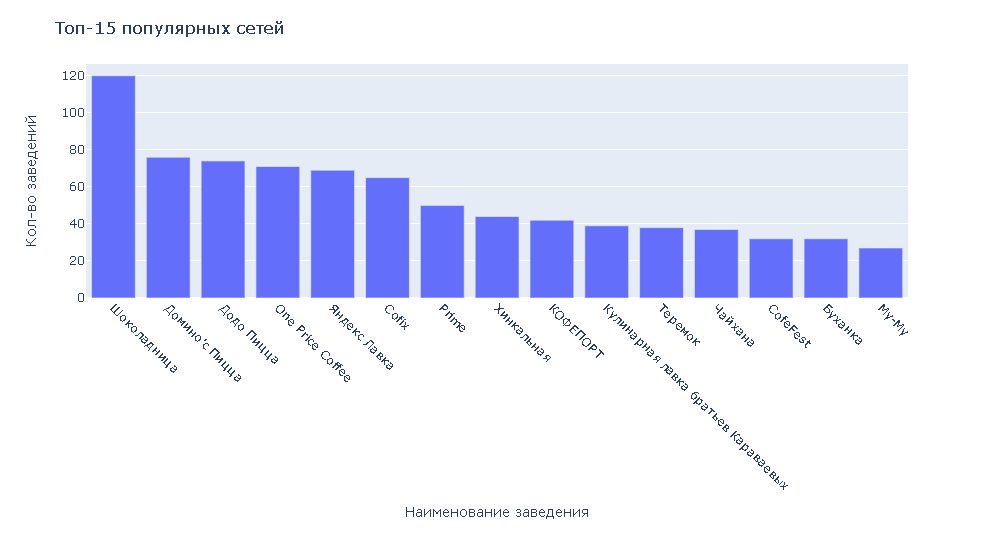

In [25]:
#делаю выборку из заведений определенных ранее
top_15=df.query("name == ['Шоколадница', 'Домино’c Пицца', 'Додо Пицца', 'One Price Coffee', 'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ', 'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана', 'CofeFest', 'Буханка', 'Му-Му']")
top_15=top_15.pivot_table(index=['name', 'category', 'district'], values='rating', aggfunc='count').sort_values('rating', ascending=False).reset_index()
top_15.columns=['name', 'category', 'district', 'count']
top_15.head(10)

,name,category,district,count
0,Шоколадница,кофейня,Центральный административный округ,38
1,Prime,ресторан,Центральный административный округ,36
2,Кулинарная лавка братьев Караваевых,кафе,Центральный административный округ,32
3,Cofix,кофейня,Центральный административный округ,20
4,Шоколадница,кофейня,Западный административный округ,17
5,One Price Coffee,кофейня,Центральный административный округ,15
6,КОФЕПОРТ,кофейня,Центральный административный округ,15
7,Шоколадница,кофейня,Северный административный округ,13
8,Яндекс Лавка,ресторан,Южный административный округ,12
9,Шоколадница,кофейня,Восточный административный округ,12


In [26]:
fig = px.bar(top_15, x='district', y='count', color='category')
fig.update_layout(title="Анализ топ 15 популярных сетей",
                  xaxis_title="Наименование административного округа",
                  yaxis_title="Количество заведений")
fig.update_xaxes(tickangle=45)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

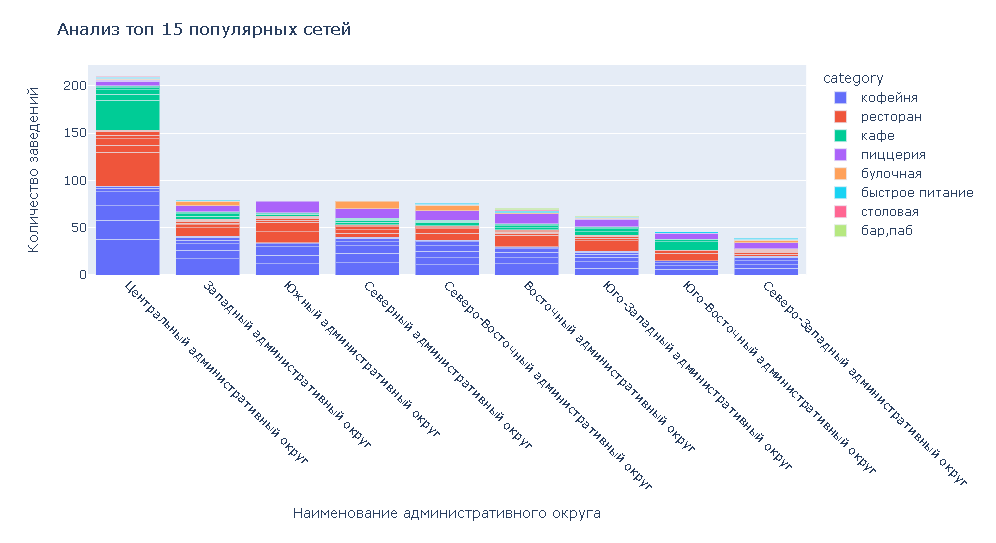

In [27]:
fig = px.bar(top_15, x='category', y='count', color='district')
fig.update_layout(title="Анализ топ 15 популярных сетей",
                  xaxis_title="Наименование категории",
                  yaxis_title="Количество заведений")
fig.update_xaxes(tickangle=45)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

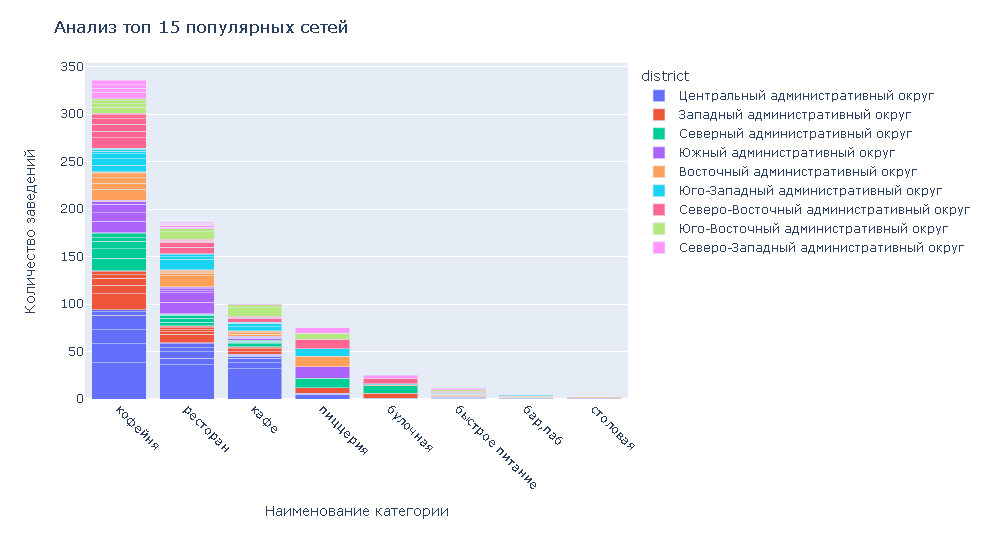

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Заведения из топ-15 самых популярных представлены во всех административных округах.
<br>- Центральный административный округ всеравно лидирует по кол-ву заведений из топ-15
<br>- Категория Кофейня - самая многочисленная из топ-15
<br>- Категории быстрое питание, бар-паб и столовые самые малочисленные

#### Анализ заведений по административным районам

In [28]:
df['district'].unique(), df['district'].nunique()

(array(['Северный административный округ',
        'Северо-Восточный административный округ',
        'Северо-Западный административный округ',
        'Западный административный округ',
        'Центральный административный округ',
        'Восточный административный округ',
        'Юго-Восточный административный округ',
        'Южный административный округ',
        'Юго-Западный административный округ'], dtype=object),
 9)

In [29]:
district_count=df.pivot_table(index=['district', 'category'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
district_count.head(10)

,district,category,name
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
5,Восточный административный округ,кафе,272
6,Северо-Восточный административный округ,кафе,269
7,Южный административный округ,кафе,264
8,Западный административный округ,кафе,239
9,Юго-Западный административный округ,кафе,238


In [30]:
fig = px.bar(district_count, x='district', y='name', color='category')
fig.update_layout(title="Анализ количества заведений по административным районам",
                  xaxis_title="Наименование административного округа",
                  yaxis_title="Количество заведений")
fig.update_xaxes(tickangle=45)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

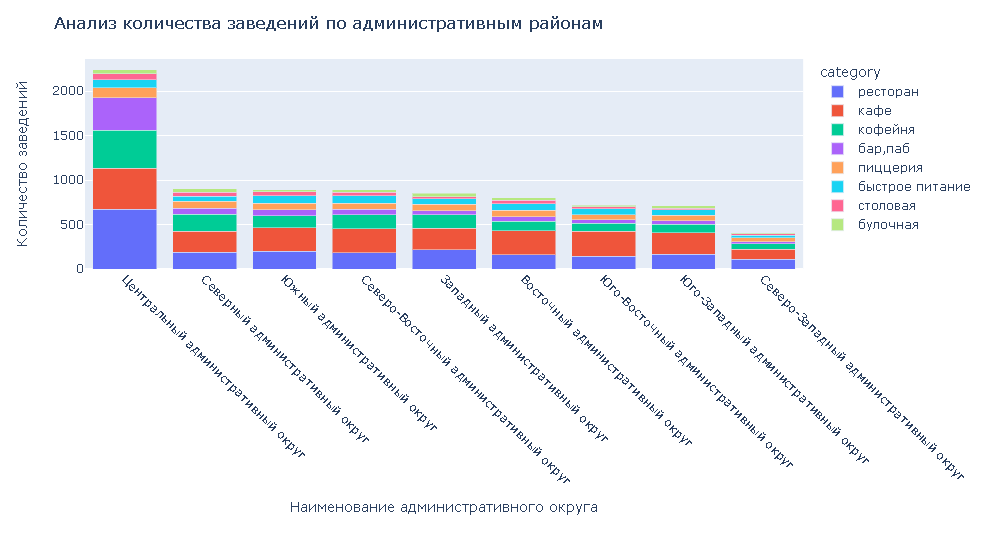

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- В датасете представлены 9 административных районов
<br>- В Центральном административном округе значительно больше расположено заведений, чем в остальных

####  Анализ распределения средних рейтингов по категориям заведений

In [31]:
rating_mean=df.pivot_table(index=['category'], values='rating', aggfunc='mean').sort_values('rating', ascending=False).reset_index()
rating_mean['rating']=round(rating_mean['rating'], 1)
rating_mean

,category,rating
0,"бар,паб",4.4
1,пиццерия,4.3
2,ресторан,4.3
3,кофейня,4.3
4,булочная,4.3
5,столовая,4.2
6,кафе,4.1
7,быстрое питание,4.1


In [32]:
fig = px.bar(rating_mean, x='category', y='rating')
fig.update_layout(title='Анализ распределения средних рейтингов по категориям заведений',
                  xaxis_title="Категория заведения",
                  yaxis_title="Средний рейтинг")
fig.update_xaxes(tickangle=45)
fig.update_yaxes(range=(3.8, 4.5))
fig.show()

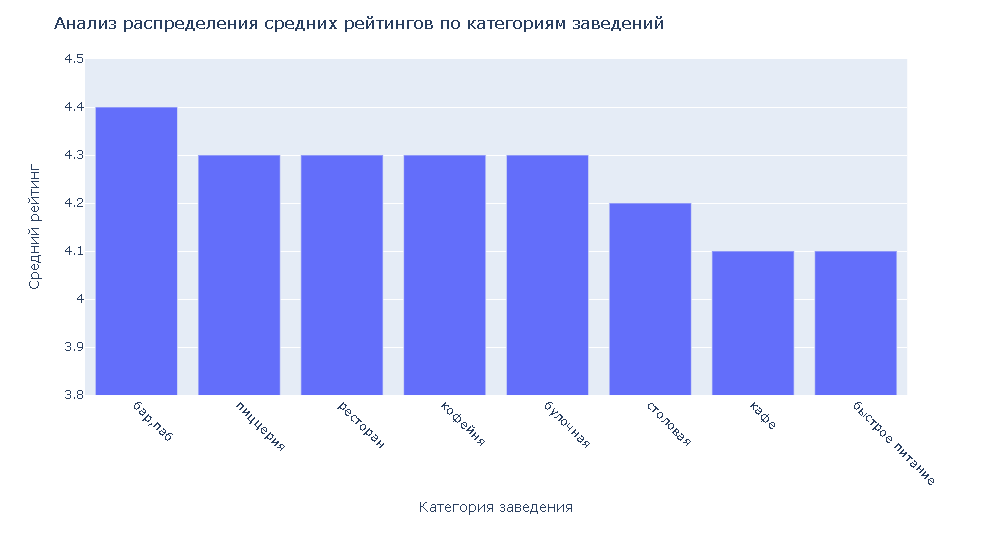

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Самый высокий средний рейтинг наблюдается у "бар,паб", самый низкий у "быстрое питание"
<br>- Распределение среднийх рейтингов нормальное

#### Анализ распределения среднего рейтинга заведений по районам

In [33]:
rating_mean_geo=df.pivot_table(index=['district'], values='rating', aggfunc='mean').sort_values('rating', ascending=False).reset_index()
rating_mean_geo

,district,rating
0,Центральный административный округ,4.377520
1,Северный административный округ,4.239778
2,Северо-Западный административный округ,4.208802
3,Южный административный округ,4.184417
4,Западный административный округ,4.181551
5,Восточный административный округ,4.174185
6,Юго-Западный административный округ,4.172920
7,Северо-Восточный административный округ,4.148260
8,Юго-Восточный административный округ,4.101120


In [34]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_mean_geo,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

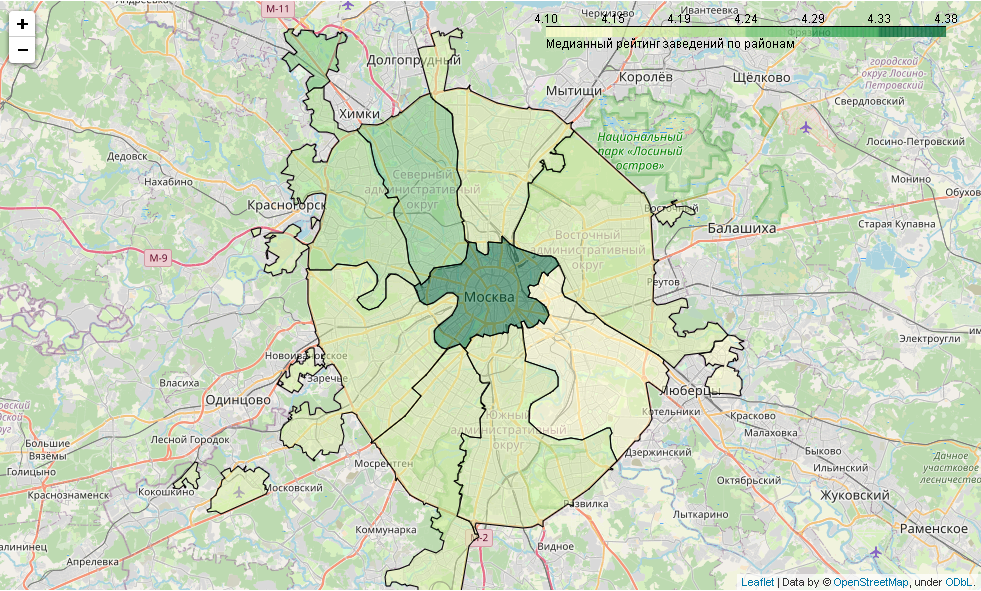

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Самые высокий рейтинги заведений в центре Москвы

#### Анализ количества заведений с распределением по районам

In [35]:
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

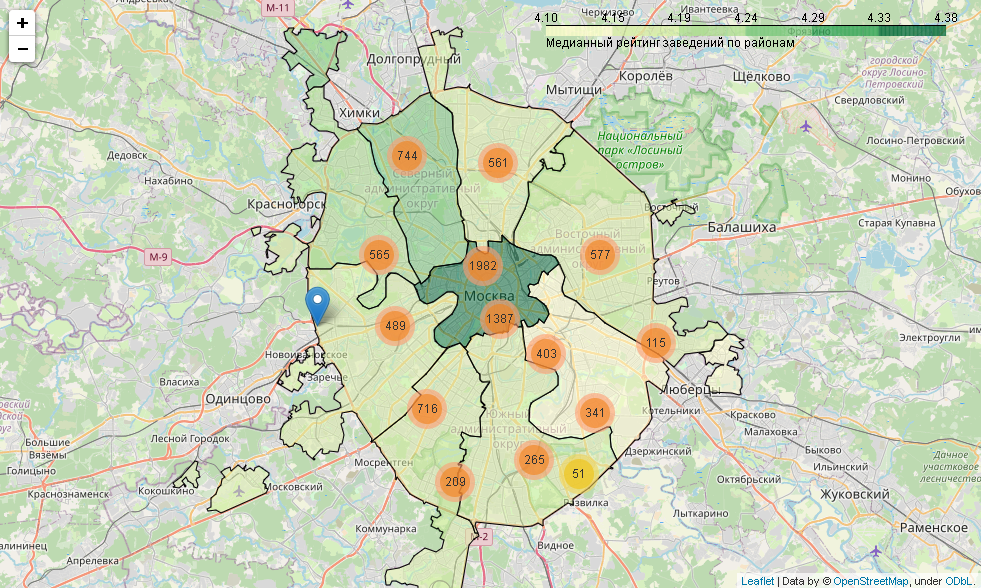

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Самая высокая концентрация заведений в центре Москвы

#### Анализ топ 15 улиц по кол-ву заведений

In [36]:
street_count_top=df.pivot_table(index=['street'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index().head(15)
street_count_top

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,75
8,Ленинградское шоссе,69
9,Люблинская улица,60


In [37]:
test32=df.query("street == ['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица', 'Алтуфьевское шоссе']")
test32=test32.pivot_table(index=['street', 'category'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
test32

,street,category,name
0,проспект Мира,кафе,53
1,проспект Мира,ресторан,45
2,проспект Мира,кофейня,36
3,Профсоюзная улица,кафе,35
4,проспект Вернадского,ресторан,33
5,Ленинский проспект,ресторан,33
6,Ленинский проспект,кафе,26
7,Профсоюзная улица,ресторан,26
8,Люблинская улица,кафе,26
9,Ленинградское шоссе,ресторан,25


In [38]:
fig = px.bar(test32, x='street', y='name', color='category')
fig.update_layout(title='Анализ топ 15 улиц по кол-ву заведений',
                  xaxis_title="Категория заведения",
                  yaxis_title="Наименование улицы")
fig.update_xaxes(tickangle=45)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

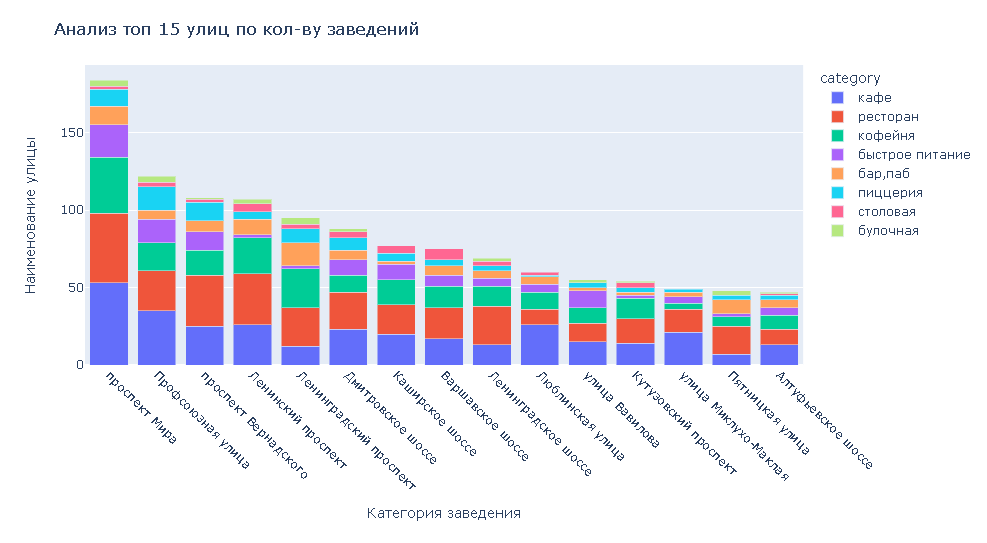

In [39]:
street_count_bot=df.pivot_table(index=['street', 'district'], values='name', aggfunc='count')
street_count_bot=street_count_bot.query('name == 1').reset_index()
display(street_count_bot.tail())

,street,district,name
451,улица Чечулина,Восточный административный округ,1
452,улица Чистова,Юго-Восточный административный округ,1
453,улица Шкулёва,Юго-Восточный административный округ,1
454,улица Шухова,Южный административный округ,1
455,улица Юннатов,Северный административный округ,1


In [40]:
fig = go.Figure(data=[go.Pie(labels=street_count_bot['district'], values=street_count_bot['name'])])
fig.update_layout(title='Анализ улиц с минимальным размещением заведений')
fig.show()

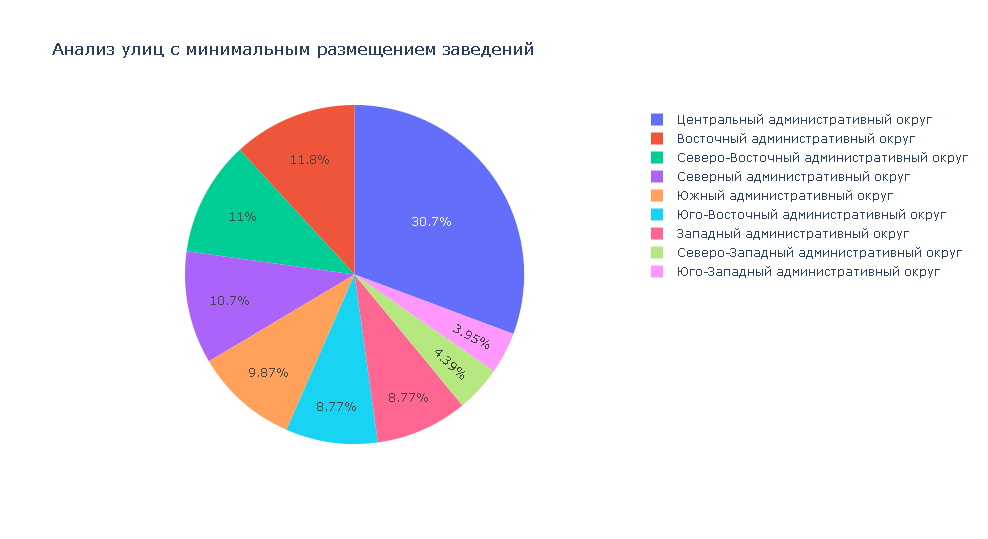

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- На проспекте Мира размещено значительно больше заведений, чем на отальных.
<br>- Улицы с одним размещенным заведением, есть во всех административных центрах.
<br>- В центральном округе больше всего улиц с одним заведением.

#### Анализ среднего чека по районам

In [41]:
district_middle_avg=df.pivot_table(index='district', values='middle_avg_bill', aggfunc='mean').sort_values('middle_avg_bill', ascending=False).reset_index()
district_middle_avg['middle_avg_bill']=round(district_middle_avg['middle_avg_bill'], 2)
display(district_middle_avg)
print('Самый высокий средний чек заведения в центральном и западном административных округах')
print('В восточных административных округах самые низкие средние чеки')

,district,middle_avg_bill
0,Центральный административный округ,1191.06
1,Западный административный округ,1053.23
2,Северный административный округ,927.96
3,Южный административный округ,834.40
4,Северо-Западный административный округ,822.22
5,Восточный административный округ,820.63
6,Юго-Западный административный округ,792.56
7,Северо-Восточный административный округ,716.61
8,Юго-Восточный административный округ,654.10


Самый высокий средний чек заведения в центральном и западном административных округах
В восточных административных округах самые низкие средние чеки


In [42]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_middle_avg,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

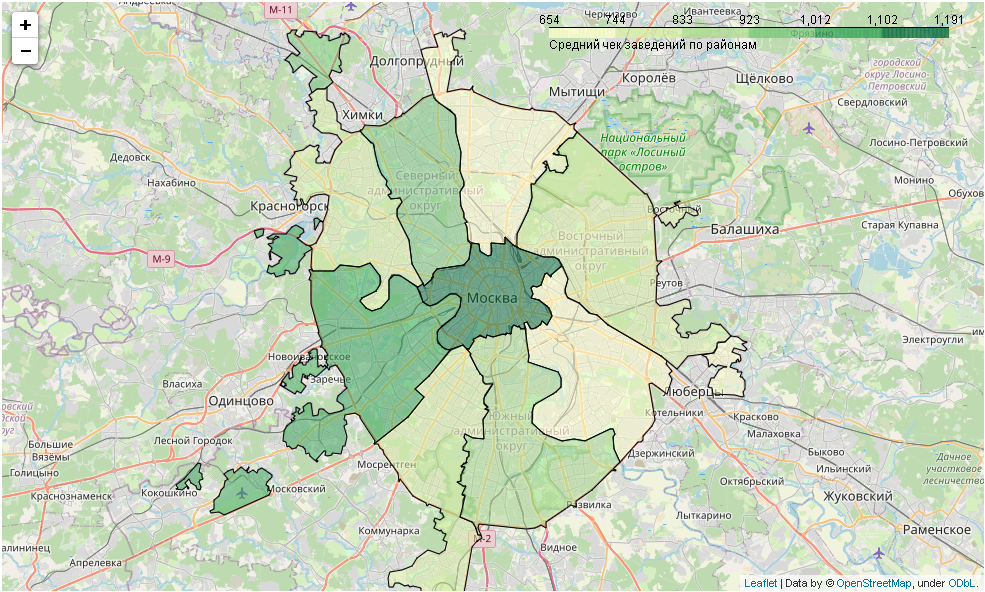

<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Наибольший средний чек в центральном районе Москвы

#### Итоговые выводы по исследованию

<b>Количественные показатели</b>:
- Самое большое кол-во заведений приходится на три категории: кафе, ресторан и кофейня
- Самое большое среднее кол-во посадочных мест приходится на три категории: ресторан, бар и кофейня
- Категория Кофейня - самая многочисленная из топ-15
- Категории быстрое питание, бар-паб и столовые самые малочисленные

<b>Качественные показатели</b>:
- Самый высокий средний рейтинг наблюдается у "бар,паб", самый низкий у "быстрое питание"
- Распределение среднийх рейтингов нормальное

<b>Итоги анализа сетевых и несетевых заведений</b>:
- Сетевых заведений в датасете значительно меньше
- У сетевых заведений чаще встречаются категории: кофейни, пицерии, булочная
- У несетевых заведений чаще встречаются категории: кафе, ресторан, паб-бар, столовая
- Категория "быстрое питание" встречается одинаково часто в обеих группах

<b>Территориальные выводы</b>:
- В датасете представлены 9 административных районов
- Центральный административный округ всеравно лидирует по кол-ву заведений из топ-15
- В Центральном административном округе значительно больше расположено заведений, чем в остальных
- Самые высокий рейтинги заведений в центре Москвы
- Самая высокая концентрация заведений в центре Москвы
- На проспекте Мира размещено значительно больше заведений, чем на остальных.
- Улицы с одним размещенным заведением, есть во всех административных центрах.
- Наибольший средний чек в центральном районе Москвы

### Детализируем исследование: открытие кофейни

In [43]:
koff=df.query('category == "кофейня"')
koff_count=koff['name'].count()

In [44]:
koff.pivot_table(index=['hours'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index().head(15)

,hours,name
0,"ежедневно, 10:00–22:00",140
1,"ежедневно, 08:00–22:00",60
2,"ежедневно, круглосуточно",59
3,"ежедневно, 09:00–22:00",57
4,пн-пт 08:00–19:00,46
5,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",46
6,"ежедневно, 09:00–21:00",43
7,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",42
8,"ежедневно, 08:00–21:00",36
9,пн-пт 08:00–18:30,34


In [45]:
koff_district_rating=koff.pivot_table(index=['district'], values='rating', aggfunc='mean').sort_values('rating', ascending=False).reset_index()
koff_district_rating['rating']=round(koff_district_rating['rating'], 2)
koff_district_rating

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


In [46]:
full_times=koff.query('hours == "ежедневно, круглосуточно"')
full_times=full_times['hours'].count()
full_times

59

In [47]:
#информация о стоимости чашки кофе есть только о 521 заведении
middle_coffee_cup=koff['middle_coffee_cup'].dropna().reset_index()
middle_coffee_cup=middle_coffee_cup.sort_values('middle_coffee_cup', ascending=False)
#строка 204 с ценой в 1568 выглядит как выброс, удаляю 
middle_coffee_cup=middle_coffee_cup.drop(labels=204)
middle_coffee_cup

,index,middle_coffee_cup
388,5503,375.0
258,3718,328.0
115,1769,325.0
409,5990,320.0
148,2075,315.0
320,4657,300.0
246,3580,300.0
440,6687,300.0
217,3095,300.0
311,4578,300.0


In [48]:
fig = px.bar(middle_coffee_cup, x='middle_coffee_cup', y='middle_coffee_cup')
fig.update_layout(title='Анализ цен на одну чашку кофе по Москве',
                  xaxis_title="Цена чашки кофе",
                  yaxis_title="Кол-во заведений")
fig.update_xaxes(tickangle=45)
fig.show()
koff_price=256

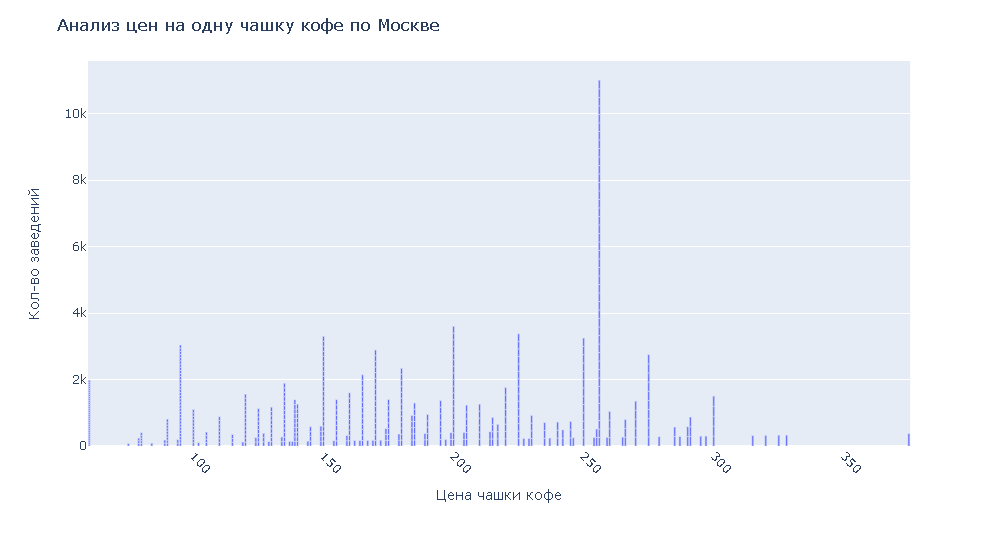

In [49]:
#проверю средние цены на чашку кофе по округам
mean_price_coffe=187
mean_price_coffes=koff.pivot_table(index=['district'], values='middle_coffee_cup', aggfunc='mean').sort_values('middle_coffee_cup', ascending=False).reset_index()
mean_price_coffes['middle_coffee_cup']=round(mean_price_coffes['middle_coffee_cup'], 2)
mean_price_coffes

,district,middle_coffee_cup
0,Западный административный округ,189.94
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Восточный административный округ,174.02
4,Северный административный округ,165.79
5,Северо-Западный административный округ,165.52
6,Северо-Восточный административный округ,165.33
7,Южный административный округ,158.49
8,Юго-Восточный административный округ,151.09


In [50]:
koff_district_seats=koff.pivot_table(index='district', values='seats', aggfunc='median').sort_values('seats', ascending=False).reset_index()
koff_district_seats

,district,seats
0,Западный административный округ,96.0
1,Северо-Западный административный округ,87.5
2,Центральный административный округ,86.0
3,Южный административный округ,80.0
4,Северо-Восточный административный округ,75.0
5,Северный административный округ,66.0
6,Юго-Западный административный округ,64.5
7,Восточный административный округ,55.0
8,Юго-Восточный административный округ,50.0


In [51]:
fig = go.Figure(data=[go.Pie(labels=koff_district_seats['district'], values=koff_district_seats['seats'])])
fig.update_layout(title='Анализ кол-ва посадочных мест по округам')
fig.show()

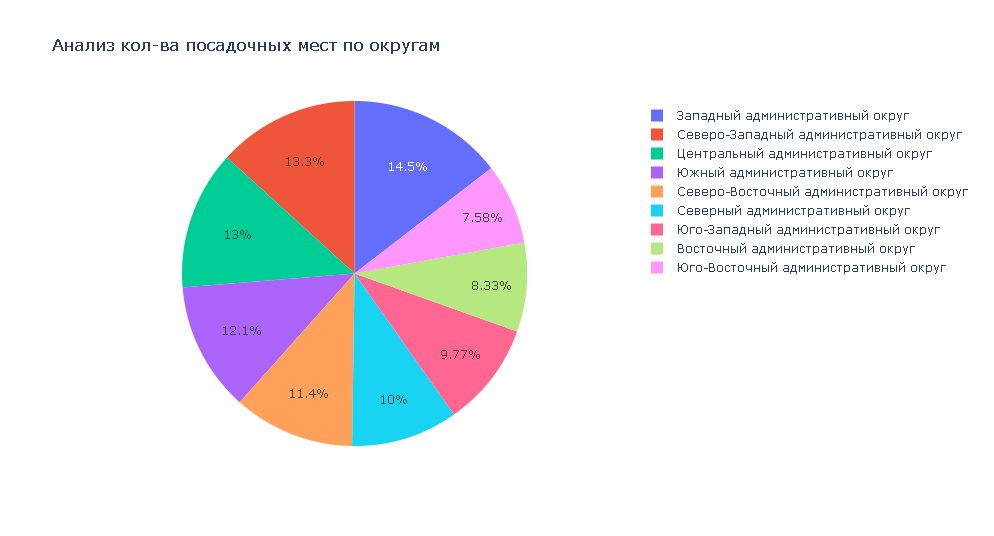

In [52]:
#столбчатая диаграмма немного нагляднее
fig = px.bar(koff_district_seats, x='district', y='seats')
fig.update_layout(title='Анализ кол-ва посадочных мест по округам',
                  xaxis_title="Административный округ",
                  yaxis_title="Кол-во посадочных мест")
fig.update_xaxes(tickangle=45)
fig.show()
centre_seats=86

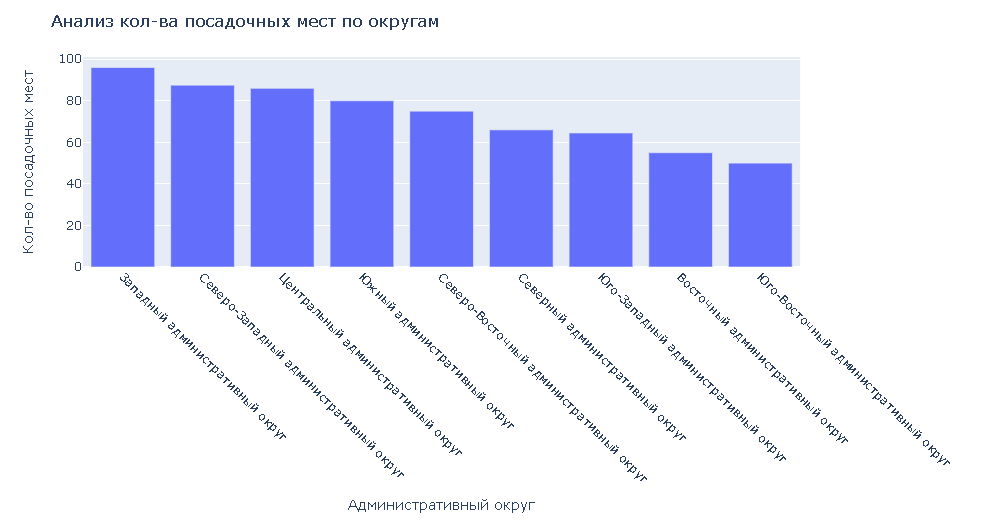

In [53]:
print(f'Вывод: В датасете {koff_count} заведения категории "кофейня"')
print(f'В круглосуточном режиме работает только {full_times} заведений')
print(f'Самая распространенная стоимость одной чашки кофе {koff_price} руб.')
print(f'Средняя стоимость чашки кофе в центральном районе {mean_price_coffe} руб.')
print(f'В центральном районе в среднем {centre_seats} посадочных мест')

Вывод: В датасете 1413 заведения категории "кофейня"
В круглосуточном режиме работает только 59 заведений
Самая распространенная стоимость одной чашки кофе 256 руб.
Средняя стоимость чашки кофе в центральном районе 187 руб.
В центральном районе в среднем 86 посадочных мест


<div class="alert alert-block alert-info">   
<b>Вывод:</b>
<br>- Вывод: В датасете 1413 заведения категории "кофейня"
<br>- В круглосуточном режиме работает только 59 заведений
<br>- Самая распространенная стоимость одной чашки кофе 256 руб.
<br>- Средняя стоимость чашки кофе в центральном районе 187 руб.
<br>- В центральном районе в среднем 86 посадочных мест

<div class="alert alert-block alert-info">   
<b>Рекомендации по открытию кофейни:</b>
<br> Расположение: <b>Центральный округ Москвы</b>
<br> <b>Преимущества центрального округа</b>:
<br>- Наибольший средний чек
<br>- Самые высокие рейтинги заведений
<br>- Самая большая концентрация самых популярных заведений (топ15)
<br>- Высокая концентрация подобных заведений (высокая конкуренция косвенно предполагает повышенный спрос).
<br>
<br>  <b>Кол-во посадочных мест</b>: 86
<br>  <b>Диапазон стоимости одной чашки кофе</b>: 187-256 руб
<br>  <b>Режим работы</b>: ежедневно, 10:00–22:00
<br>  <b>Основной конкурент</b>: сетевые кофейни